In [17]:
from functools import reduce
from operator import and_
from datetime import datetime

import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px

np.random.seed(42)
sns.set(rc={'figure.figsize':(11.7,8.27)})

folium_colors = ("black", "blue", "darkgreen", "darkpurple", "darkred", "orange", "pink", "purple", "red", "darkgreen")

def data_selection(df: pd.DataFrame, filters_: dict, sample: float = None, columns: list = None):
    filters = [df[column].apply(func) for column, func in filters_.items()]
    res = df[reduce(and_, filters)]
    if columns is None:
        pass
    else:
        res = res[columns] 
    res = res.copy().reset_index(drop = True)
    return res if sample is None else res.sample(sample)

def plot_ts(df: pd.DataFrame, col: str):
    freq_df = df.groupby(
        by = [col, "Primary Type"]
    ).agg({"ID": len}).unstack().droplevel(
        0, axis = 1
    ).stack().reset_index().rename(columns = {0: "values"})
    sns.lineplot(
        data = freq_df, 
        x = col, 
        y = "values", 
        hue = "Primary Type",
    )

columns = ["parsed_date", "Primary Type", "Location Description", "Arrest", "Latitude", "Longitude", "Location"]

df_full = pd.read_csv("data/raw/Chicago_Crimes_2012_to_2017.csv", header = 0)
df_full["parsed_date"] = pd.to_datetime(df_full["Date"])
df_full.dropna(subset = columns, inplace = True)
df_full["weekofyear"] = df_full.parsed_date.dt.isocalendar().week
df_full["monthofyear"] = df_full.parsed_date.dt.month

In [3]:
pd.options.display.max_columns = 100
pd.options.display.max_rows = 100

df_full.head()

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,parsed_date,weekofyear,monthofyear
0,3,10508693,HZ250496,05/03/2016 11:40:00 PM,013XX S SAWYER AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,APARTMENT,True,True,1022,10.0,24.0,29.0,08B,1154907.0,1893681.0,2016,05/10/2016 03:56:50 PM,41.864073,-87.706819,"(41.864073157, -87.706818608)",2016-05-03 23:40:00,18,5
1,89,10508695,HZ250409,05/03/2016 09:40:00 PM,061XX S DREXEL AVE,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,313,3.0,20.0,42.0,08B,1183066.0,1864330.0,2016,05/10/2016 03:56:50 PM,41.782922,-87.604363,"(41.782921527, -87.60436317)",2016-05-03 21:40:00,18,5
2,197,10508697,HZ250503,05/03/2016 11:31:00 PM,053XX W CHICAGO AVE,0470,PUBLIC PEACE VIOLATION,RECKLESS CONDUCT,STREET,False,False,1524,15.0,37.0,25.0,24,1140789.0,1904819.0,2016,05/10/2016 03:56:50 PM,41.894908,-87.758372,"(41.894908283, -87.758371958)",2016-05-03 23:31:00,18,5
3,673,10508698,HZ250424,05/03/2016 10:10:00 PM,049XX W FULTON ST,0460,BATTERY,SIMPLE,SIDEWALK,False,False,1532,15.0,28.0,25.0,08B,1143223.0,1901475.0,2016,05/10/2016 03:56:50 PM,41.885687,-87.749516,"(41.885686845, -87.749515983)",2016-05-03 22:10:00,18,5
4,911,10508699,HZ250455,05/03/2016 10:00:00 PM,003XX N LOTUS AVE,0820,THEFT,$500 AND UNDER,RESIDENCE,False,True,1523,15.0,28.0,25.0,06,1139890.0,1901675.0,2016,05/10/2016 03:56:50 PM,41.886297,-87.761751,"(41.886297242, -87.761750709)",2016-05-03 22:00:00,18,5


In [11]:
crime_types_percentage = (df_full["Primary Type"].value_counts().cumsum() / df_full.shape[0]).iloc[:5]
crimes_types = crime_types_percentage.index.tolist()
crimes_types

['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS', 'ASSAULT']

In [5]:
# temp_df = df_full[df_full["Primary Type"].isin(crimes_types)].groupby(by = ["monthofyear", "Primary Type"]).count().unstack().droplevel(0, axis = 1).stack().reset_index().rename(columns={0: "count"})

# [df_full["Primary Type"].isin(crimes_types)
fig = px.histogram(df_full, x='weekofyear', color='Primary Type')

fig.show()

<AxesSubplot:xlabel='weekofyear', ylabel='values'>

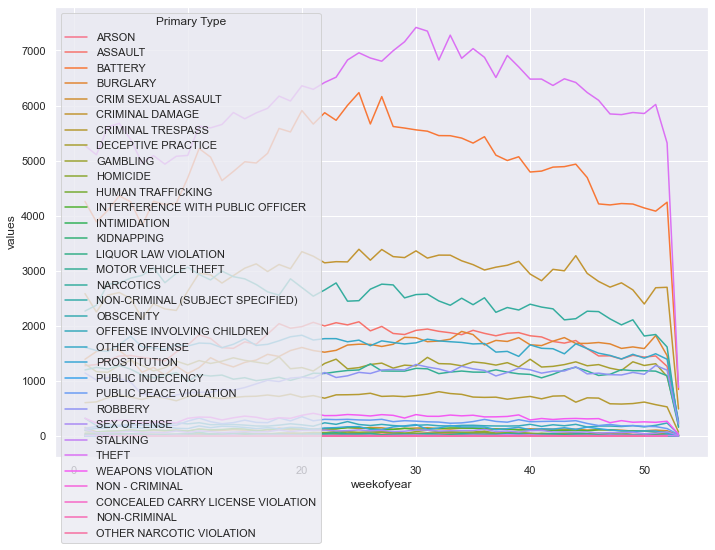

In [16]:
sns.lineplot(
    data = df_full.groupby(
        by = ["weekofyear", "Primary Type"]
    ).agg({"ID": len}).unstack().droplevel(
        0, axis = 1
    ).stack().reset_index().rename(columns = {0: "values"}),
    x = "weekofyear",
    y = "values",
    hue = "Primary Type"
)

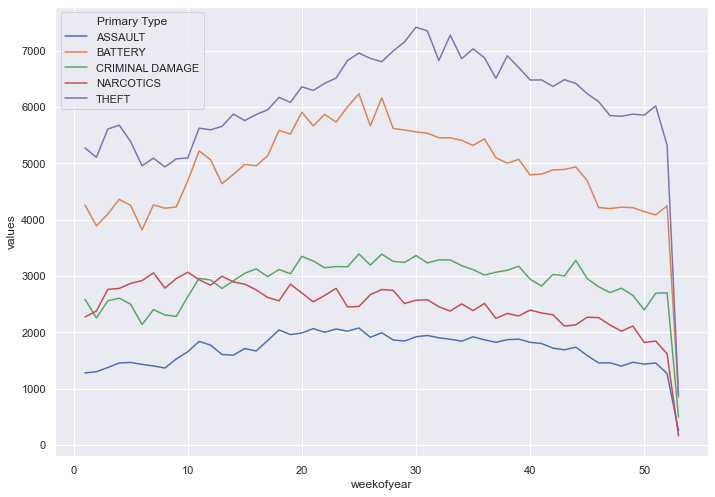

In [20]:
plot_ts(df_full[df_full["Primary Type"].isin(crimes_types)], "weekofyear")

In [90]:
filtered_df = data_selection(
    df_full, 
    {
        "Arrest": lambda x: x == False,
        "parsed_date": lambda x: x.month == 7,
        "Primary Type": lambda x: x in crime_types_percentage.index
    },
    sample = 50_000,
    columns = columns
)

f"Keeping {filtered_df.shape[0]:,} ({filtered_df.shape[0] / df_full.shape[0] * 100:.2f}%) records"

'Keeping 50,000 (3.53%) records'

In [38]:
# px.set_mapbox_access_token(open(".mapbox_token").read())

# fig = px.scatter_mapbox(
#     filtered_df, 
#     lat="Latitude", 
#     lon="Longitude",     
#     color="Primary Type", 
#     # size="car_hours",
#     color_continuous_scale = px.colors.carto, # px.colors.cyclical.IceFire, 
#     size_max=15, 
#     zoom=10
# )
# fig.show()

In [19]:
filtered_df.shape

(25000, 26)

In [41]:
filtered_df.head()

,Date,Primary Type,Location Description,Arrest,Latitude,Longitude,Location
23632,07/19/2013 07:00:00 AM,THEFT,STREET,False,41.736414,-87.620490,"(41.736413551, -87.620490178)"
48497,07/17/2015 03:00:00 AM,BATTERY,SIDEWALK,False,41.952473,-87.766979,"(41.952472867, -87.766979352)"
42255,07/31/2014 06:20:00 PM,THEFT,RESIDENCE,False,41.736003,-87.729971,"(41.736003249, -87.729971162)"
59928,07/13/2016 05:57:00 AM,BATTERY,SIDEWALK,False,41.869447,-87.744861,"(41.869447309, -87.744861466)"
49630,07/18/2015 03:00:00 PM,THEFT,RESIDENCE PORCH/HALLWAY,False,41.945424,-87.652536,"(41.945424339, -87.652535635)"


In [92]:
import os

filtered_df["shift"] = filtered_df.parsed_date.dt.hour // 8
# ["THEFT", "BATTERY", "CRIMINAL DAMAGE", "NARCOTICS", "ASSAULT"]
filtered_df["type_"] = filtered_df["Primary Type"].apply(lambda x: crimes_types.index(x))

# Touching a person that does not invite touching or blatantly says to stop is battery. 
# https://newmexicocriminallaw.com/typical-examples-of-assault-and-battery-acts/#:~:text=Touching%20a%20person%20that%20does,hurt%20them%2C%20would%20constitute%20battery.
costs = {"THEFT": 300, "BATTERY": 500, "CRIMINAL DAMAGE": 800, "NARCOTICS": 1_000, "ASSAULT": 500}
pd.Series(costs).to_csv(os.path.join("data", "cooked", "resource_cost.csv"))

# Select random locations
L = 50
possible_locations = filtered_df.sample(L)["Location"]
possible_locations.to_csv(os.path.join("data", "cooked", "locations.csv"), index = False)

def dist(x1, y1, x2, y2):
    # https://sciencing.com/understand-latitude-longitude-5752494.html
    return ((x1 - x2) ** 2 + (y1 - y2) ** 2) ** (1/2) * 10_000 / 90

dist_from_center = possible_locations.apply(lambda loc: dist(*eval(loc), df_full.Latitude.mean(), df_full.Longitude.mean()))
dist_from_center.to_csv(os.path.join("data", "cooked", "dist_from_center.csv"))

# Select crime data (demand)
N = 2_000
for i in range(5):
    sampled = filtered_df.sample(N, weights = filtered_df.groupby("Primary Type")["Primary Type"].transform("count"))
    sampled.to_csv(os.path.join("data", "cooked", "col_sample_{i}.csv"))
    sampled[["type_", "shift"]].to_csv(os.path.join("data", "cooked", f"sample_{i}.csv"), index = False)
    distances = sampled.Location.apply(lambda loc: pd.Series(dist(*eval(loc), *eval(l)) for l in possible_locations))
    distances.to_csv(os.path.join("data", "cooked", f"distances_{i}.csv"))

In [80]:
distances.describe()

,0,1,2,3,4,5,6,7,8,9
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,14.120718,19.414558,15.761187,15.505643,15.114795,14.137280,11.678542,18.329771,19.470794,13.147442
std,17.944226,18.626733,17.482335,18.224504,17.415512,17.614800,17.200308,18.472916,18.668460,17.932236
min,0.182350,0.054856,0.163843,0.269759,0.051417,0.142735,0.201531,0.494954,0.150652,0.172044
25%,7.412349,12.316571,10.106570,8.351064,9.779515,7.350967,6.989357,8.664022,12.405251,6.573752
50%,12.706692,17.293963,15.353609,13.671473,14.611828,13.605850,10.105191,19.376785,17.120463,10.050552
75%,19.789891,26.714786,20.385360,22.141692,19.514037,19.135383,15.450836,25.506154,26.750131,18.970704
max,741.751388,746.722374,728.868396,735.333124,728.935056,725.168617,732.393457,724.142014,746.471173,738.230648


In [87]:
dist_from_center.max()

23.867858000812216